In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('../../Thomas/gent-commuters/Thomas/Notebooks/')
from utils import *

/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [4]:
track = "track2"
from track2 import *

In [6]:
melody_filename = os.path.join('components',root_name+'_melody.mid')
components_folder = os.path.join('components',root_name)
os.makedirs(components_folder, exist_ok=True)

In [13]:
import magenta
import magenta.music as mm
from magenta.protobuf import generator_pb2
from magenta.protobuf import music_pb2
from magenta.music.chord_inference import infer_chords_for_sequence
from magenta.music.chords_lib import extract_chords, BasicChordRenderer
from magenta.music.chord_symbols_lib import chord_symbol_bass, chord_symbol_pitches, chord_symbol_root
from magenta.music.chords_encoder_decoder import encoder_decoder
from magenta.music.midi_io import sequence_proto_to_pretty_midi, sequence_proto_to_midi_file, midi_file_to_sequence_proto

In [35]:
melody = magenta.music.sequences_lib.remove_redundant_data(midi_file_to_sequence_proto(melody_filename))
melody.tempos[0].qpm = bpm
quantized_melody = quantize_note_sequence(melody, 8)
infer_chords_for_sequence(quantized_melody)
chord_renderer = BasicChordRenderer(program=63)
chord_renderer.render(quantized_melody)

INFO:tensorflow:Sequence has key change from F to C at 3.000000 seconds.
INFO:tensorflow:Sequence has key change from C to D at 43.500000 seconds.
INFO:tensorflow:Sequence has key change from D to C at 102.000000 seconds.


In [36]:
chords = magenta.protobuf.music_pb2.NoteSequence()
chords.CopyFrom(quantized_melody)
bass = magenta.protobuf.music_pb2.NoteSequence()
bass.CopyFrom(quantized_melody)
notes_to_delete_from_chords = []
notes_to_delete_from_bass = []
idx = 0
for n in quantized_melody.notes:
    if n.program!=63:
        notes_to_delete_from_chords.append(n)
        notes_to_delete_from_bass.append(n)
    else:
        if n.pitch <= 47:
            notes_to_delete_from_chords.append(n)
        else:
            notes_to_delete_from_bass.append(n)
for n in notes_to_delete_from_chords:
    chords.notes.remove(n)
for n in notes_to_delete_from_bass:
    bass.notes.remove(n)
for n in bass.notes:
    n.program = 37

In [88]:
bar_length = 60.0 * float(beat_per_bar)/bpm
steps_per_bar = beat_per_bar * steps_per_beat *2

In [93]:
steps = pd.DataFrame.from_records([
    {
        'quality':magenta.music.chord_symbol_quality(c), 
        'chord':c, 
        'bar':int(idx/steps_per_bar),
        'step':idx
    } for idx, c in enumerate(extract_chords(quantized_melody)[0][0])])
steps['change'] = steps['chord'] != steps['chord'].shift()
changes = steps[steps['change']].copy()
changes['num_changes_in_bar'] = changes.groupby('bar')['step'].transform(lambda x : x.count())
changes['moment'] = changes['step'] % steps_per_bar
changes

,bar,chord,quality,step,change,num_changes_in_bar,moment
0,0,C7,0,0,True,3,0
32,0,Gmaj7,0,32,True,3,32
48,0,Bbmaj7,0,48,True,3,48
64,1,G7,0,64,True,3,0
96,1,C,0,96,True,3,32
112,1,Fmaj7,0,112,True,3,48
128,2,G7,0,128,True,2,0
176,2,C,0,176,True,2,48
192,3,G7,0,192,True,3,0
208,3,C7,0,208,True,3,16


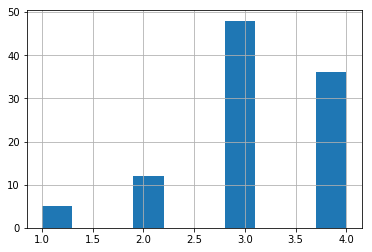

In [96]:
%matplotlib inline
changes['num_changes_in_bar'].hist()

In [97]:
mm.play_sequence(melody, mm.midi_synth.fluidsynth)

In [ ]:
steps['num_changes'] = steps

In [94]:
interet = 11
for i in range(-2,3):
    print(i+interet)
    if len(chords_bars[interet+i].notes):
        mm.play_sequence(chords_bars[interet+i], mm.midi_synth.fluidsynth)


9


10
11


12


13


In [38]:
# Cheap way to "unquantize": serialize through midi
sequence_proto_to_midi_file(chords, os.path.join(components_folder,'chords.mid'))
sequence_proto_to_midi_file(bass, os.path.join(components_folder, 'bass.mid'))
chords = midi_file_to_sequence_proto(os.path.join(components_folder,'chords.mid'))
bass = midi_file_to_sequence_proto(os.path.join(components_folder,'bass.mid'))
chords_bars = filter_good_chords(split_note_sequence(chords, bar_length))
bass_bars = filter_good_chords(split_note_sequence(bass, bar_length))
melody_bars = filter_good_chords(split_note_sequence(melody, bar_length))

In [39]:
for i in range(6):
    mm.play_sequence(melody_bars[i], mm.midi_synth.fluidsynth)

In [99]:
chords_bars = split_note_sequence(chords, 16*bar_length)
bass_bars = split_note_sequence(bass, 16*bar_length)
melody_bars = split_note_sequence(melody, 16*bar_length)

In [100]:
sequence_proto_to_midi_file(chords_bars[0], 'components/funk_24/chords_16bar.mid')
sequence_proto_to_midi_file(bass_bars[0], 'components/funk_24/bass_16bar.mid')
sequence_proto_to_midi_file(melody_bars[0], 'components/funk_24/melody_16bar.mid')